# LDLD unfiltered

##### List of objects:

 * ###### What_is_logpop?
  * lists with pops and below sums of nABf as first subelement and nAndBf as second. For all genomes or only linked ones?

 * ###### what_is_gen?
  * genotypes in 0,1,2 (for heterozygotes)
  
 * ###### what_is_l_mutsamples?
  * mutational load per individual 

### LOADING AND PREPARING FILES

In [17]:
setwd("~/Dropbox/LDLD")
source("analysesLDLD_header.R")
options(scipen=999)
setwd("/mnt/scratch/fabrizio/LDLD")

Loading required package: data.table
Loading required package: survival
Loading required package: lattice
Loading required package: Formula
Loading required package: ggplot2

Attaching package: ‘Hmisc’

The following objects are masked from ‘package:base’:

    format.pval, round.POSIXt, trunc.POSIXt, units

Loading required package: boot

Attaching package: ‘boot’

The following object is masked from ‘package:lattice’:

    melanoma

The following object is masked from ‘package:survival’:

    aml

Loading required package: MASS
Loading required package: segmented
mixtools package, version 1.0.3, Released 2015-04-18
This package is based upon work supported by the National Science Foundation under Grant No. SES-0518772.



In [15]:
#======================LOAD_INITIAL_FILES====================================================
#TAG 'LOAD_INITIAL_FILES'
#============================================================================================
#===========================CREATE LOGOS================
#TAG 'CREATE LOGOS'
#=========================CHECK IMBALANCE in .BAM FILES by using LOGO files==================
#TAG 'CHECK IMBALANCE' in analyses_coding1000g_SOM.R
#======================================================REMOVE CENTRAL CLUSTER
#TAG 'REMOVE CENTRAL CLUSTER'
#======================================================trios from this
#TAG 'trios from this'
#generate BED files of snps removed.
#======================================================================NETWORK-PLOTS
#TAG NETWORK-PLOTS

### PER SAMPLE ANALYSES

In order to identify if population is affected by inhomogeneous levels of linkage

In [6]:
#---import files--------------------------------------------------------------------------------------v
info1000g<-read.table("/mnt/scratch/fabrizio/LDLD/20130606_sample_info.txt",header=TRUE,sep='\t')
samples1000g<-system("zcat /mnt/sequencedb/1000Genomes/ftp/phase3/20140910/ALL.chr22.phase3_shapeit2_mvncall_integrated_v5.20130502.genotypes.vcf.gz | 
head -300 | grep '#CHROM' | head -1 | awk '{for (i=10; i<=NF; i++) print $i}'",intern=TRUE)
samplesabove95<-system("cat ~/workspace/1000genomes/above95.unrelated.samples",intern=TRUE)
nspops<-as.numeric(system("cat /mnt/scratch/fabrizio/LDLD/nspops.txt",intern=TRUE))
samples_order1000g_above95<-intersect(samplesabove95,samples1000g)
infosamples<-lapply(1:12,function(x) c())
for (i in 1:12)
{
  mysamples<-samples_imypop(samples_order1000g_above95,nspops,i)
  infosamples[[i]]<-info1000g[match(mysamples,info1000g$Sample),]
}
popsamplesi<-sapply(1:12,function(x) samples_imypopi(nspops,x))
    
#system("cat above95/coding1000g/chr*.tabchr*.minilog | grep nAB_above_freq_threshold | grep -v and_significant > above95/coding1000g/tot.nABabovethr")
#system("cat above95/coding1000g/chr*.tabchr*.minilog | grep nAB_above_freq_threshold | grep and_significant > above95/coding1000g/tot.nABabovethrsign")
mylog2<-read.table("above95/coding1000g/tot.nABabovethr")
mylog2<-sapply(2:dim(mylog2)[2],function(x) sum(mylog2[,x]))
mylog3<-read.table("above95/coding1000g/tot.nABabovethrsign")
mylog3<-sapply(2:dim(mylog3)[2],function(x) sum(mylog3[,x]))

In [7]:
#-------------------- create whole genome log file -----------------------------
#for (i in 0:11)
#{
#  system(paste0("cat above95/coding1000g/chr*.log | awk '{if ($NF==",i,"){print}}' > /mnt/scratch/fabrizio/LDLD/above95/coding1000g/all.pop",i,".log"))
#}
#-------------------- create whole genome log file by chr ----------------------
#system(paste0("mkdir above95/coding1000g/logs"))
#for (ipop in 0:11)
#  {
#  for (ichrA in 1:21)
#    {
#   for (ichrB in (ichrA+1):22)
#	{
#	system(paste0("cat above95/coding1000g/logs/chr*.log > above95/coding1000g/logs/chr",ichrA,".",ichrB,".pop",ipop,".log"))
#	}
#    }
#  }
#for (i in 0:11)
#{
#  system(paste0("cat above95/coding1000g/logs/chr*.log | awk '{if ($NF==",i,"){print}}' > /mnt/scratch/fabrizio/LDLD/above95/coding1000g/logs/all.pop",i,".log"))
#}
#-------------------- create whole genome freqlog file (genotype per sample) ---
#rm /mnt/scratch/fabrizio/LDLD/above95/coding1000g/all.freqlog
#for i in `seq 1 22`; do 
#cat above95/coding1000g/chr$i.freqlog | awk -v FS='\t' -v OFS='\t' -v CHR=$i '{if (NR>1){print CHR,$0}}' >> /mnt/scratch/fabrizio/LDLD/above95/coding1000g/all.freqlog
#done
#-------------------- creates polymorphism per individual (mutlog) file (old) --
#cat ~/workspace/1000genomes/20130606_sample_info.txt | sed s/$'\t\t'/$'\t'NA$'\t'/g > /mnt/scratch/fabrizio/LDLD/20130606_sample_info.txt
#for i in `seq 1 22`; do 
#./filter.out above95/coding1000g/chr$i.tab above95/coding1000g/chr$i.tab.mutlog 0.05 1220 & 
#done
#--------------------- creates polymorphism per individual (mutlog) file (newer)   ------------------v
#for i in `seq 1 22`; do 
#./filterbyfreq.out above95/coding1000g/chr$i.tab above95/coding1000g/chr$i.freqlog above95/coding1000g/chr$i.tab.mutlog 0.05 1220 & 
#done
#system("cat above95/coding1000g/chr*.tab.mutlog > above95/coding1000g/tot.mutlog")

for (i in 1:22)
{
if (i==1){mutperssample<-as.numeric(read.table(paste0("above95/coding1000g/chr",i,".tab.mutlog")))}
else {res2<-as.numeric(read.table(paste0("above95/coding1000g/chr",i,".tab.mutlog")));mutperssample<-rbind(mutperssample,res2)}
}
l_mutsamples<-lapply(1:12,function(x) c())
for (i in 1:12)
{
  l_mutsamples[[i]]<-apply(mutperssample[,samples_imypopi(nspops,i)],2,sum)
}
#----------------------------------------------------------------------------------------------------^

Warning message:
In read.table(paste0("above95/coding1000g/chr", i, ".tab.mutlog")): incomplete final line found by readTableHeader on 'above95/coding1000g/chr1.tab.mutlog'Warning message:
In read.table(paste0("above95/coding1000g/chr", i, ".tab.mutlog")): incomplete final line found by readTableHeader on 'above95/coding1000g/chr2.tab.mutlog'Warning message:
In read.table(paste0("above95/coding1000g/chr", i, ".tab.mutlog")): incomplete final line found by readTableHeader on 'above95/coding1000g/chr3.tab.mutlog'Warning message:
In read.table(paste0("above95/coding1000g/chr", i, ".tab.mutlog")): incomplete final line found by readTableHeader on 'above95/coding1000g/chr4.tab.mutlog'Warning message:
In read.table(paste0("above95/coding1000g/chr", i, ".tab.mutlog")): incomplete final line found by readTableHeader on 'above95/coding1000g/chr5.tab.mutlog'Warning message:
In read.table(paste0("above95/coding1000g/chr", i, ".tab.mutlog")): incomplete final line found by readTableHeader on 'abov

In [ ]:
#-------logpop from log files---------------------------------------v
#----(all that are printed in res files)----------------------------
if (FALSE)
{
  logpop<-lapply(1:12,function(x) list(c(),c()))
  for (i in 0:0)
  {
    mydata<-read.table(paste0("/mnt/scratch/fabrizio/LDLD/above95/coding1000g/all.pop",i,".log"),header=FALSE)
    logpop[[i+1]][[1]]<-sapply(3:(dim(mydata)[2]-1), function(x) sum(sapply(mydata[,x],nABf)))
    logpop[[i+1]][[2]]<-sapply(3:(dim(mydata)[2]-1), function(x) sum(sapply(mydata[,x],nAandBf)))
  }
  nAB_lFIN<-sapply(3:(dim(logFIN)[2]-1), function(x) sum(sapply(logFIN[,x],nABf)))#-1 because last is the population flag
  nAB_lYRI<-sapply(3:(dim(logYRI)[2]-1), function(x) sum(sapply(logYRI[,x],nABf)))
  nAB_lpop0<-sapply(3:(dim(logpop0)[2]-1), function(x) sum(sapply(logpop0[,x],nABf)))
  nAB_lpop1<-sapply(3:(dim(logpop1)[2]-1), function(x) sum(sapply(logpop1[,x],nABf)))
  nAandB_lFIN<-sapply(3:(dim(logFIN)[2]-1), function(x) sum(sapply(logFIN[,x],nAandBf)))
  nAandB_lYRI<-sapply(3:(dim(logYRI)[2]-1), function(x) sum(sapply(logYRI[,x],nAandBf)))
  nAandB_lpop0<-sapply(3:(dim(logpop0)[2]-1), function(x) sum(sapply(logpop0[,x],nAandBf)))
  nAandB_lpop1<-sapply(3:(dim(logpop1)[2]-1), function(x) sum(sapply(logpop1[,x],nAandBf)))
  length(nAandB_lpop0)#106
  length(nAandB_lpop1)#107
  length(nAandB_lFIN)#99
  FINsamples<-samples_imypop(samples_order1000g_above95,nspops,8)
  infosamplesFIN<-info1000g[match(FINsamples,info1000g$Sample),]
  YRIsamples<-samples_imypop(samples_order1000g_above95,nspops,10)
  infosamplesYRI<-info1000g[match(YRIsamples,info1000g$Sample),]
  pop0samples<-samples_imypop(samples_order1000g_above95,nspops,1)
  infosamplespop0<-info1000g[match(pop0samples,info1000g$Sample),]
  pop1samples<-samples_imypop(samples_order1000g_above95,nspops,2)
  infosamplespop1<-info1000g[match(pop1samples,info1000g$Sample),]
}
#logpop[[1]][[1]] 
#i<-1
#mydata<-read.table(paste0("/mnt/scratch/fabrizio/LDLD/above95/coding1000g/all.pop",i,".log"),header=FALSE)
#head(mydata)


In [36]:
load("/mnt/scratch/fabrizio/LDLD/above95/coding1000g/fullsign.RData")
logpoptot<-pairsANDlogfiles2logpop("/mnt/scratch/fabrizio/LDLD/above95/coding1000g",ntot_pops=12,summarize=FALSE)
#save(logpoptot,file="/mnt/scratch/fabrizio/LDLD/above95/coding1000g/logpoptot_fromfilelog.RData")

In [28]:
load("LDLD170216.RData")
#save(logpop,file="logpop_fromfilelog.RData")

[1] 106


	Pearson's product-moment correlation

data:  logpop[[1]][[1]] and l_mutsamples[[1]]
t = 5.4528, df = 104, p-value = 0.0000003364
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.3085161 0.6076244
sample estimates:
     cor 
0.471522 



	Pearson's product-moment correlation

data:  logpop[[2]][[1]] and l_mutsamples[[2]]
t = 3.1207, df = 105, p-value = 0.00233
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.1074238 0.4559770
sample estimates:
      cor 
0.2913402 



	Pearson's product-moment correlation

data:  logpop[[3]][[1]] and l_mutsamples[[3]]
t = 1.895, df = 100, p-value = 0.06098
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 -0.008600815  0.367358920
sample estimates:
      cor 
0.1861855 



	Pearson's product-moment correlation

data:  logpop[[5]][[1]] and l_mutsamples[[5]]
t = 6.5417, df = 101, p-value = 0.00000000254
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.3935552 0.6684814
sample estimates:
      cor 
0.5455308 



	Pearson's product-moment correlation

data:  logpop[[8]][[1]] and l_mutsamples[[8]]
t = 3.6582, df = 97, p-value = 0.000413
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.1619061 0.5105101
sample estimates:
     cor 
0.348189 



	Pearson's product-moment correlation

data:  logpop[[4]][[1]] and l_mutsamples[[4]]
t = 1.7607, df = 106, p-value = 0.08118
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 -0.02108196  0.34650002
sample estimates:
      cor 
0.1685635 



	Pearson's product-moment correlation

data:  logpop[[12]][[1]] and l_mutsamples[[12]]
t = 1.2183, df = 96, p-value = 0.2261
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 -0.07690708  0.31412627
sample estimates:
      cor 
0.1233967 


[1] 0.02800411

[1] 0.01067704

[1] 0.01130466

[1] 0.00978664

[1] 0.008180505

[1] 0.009524269

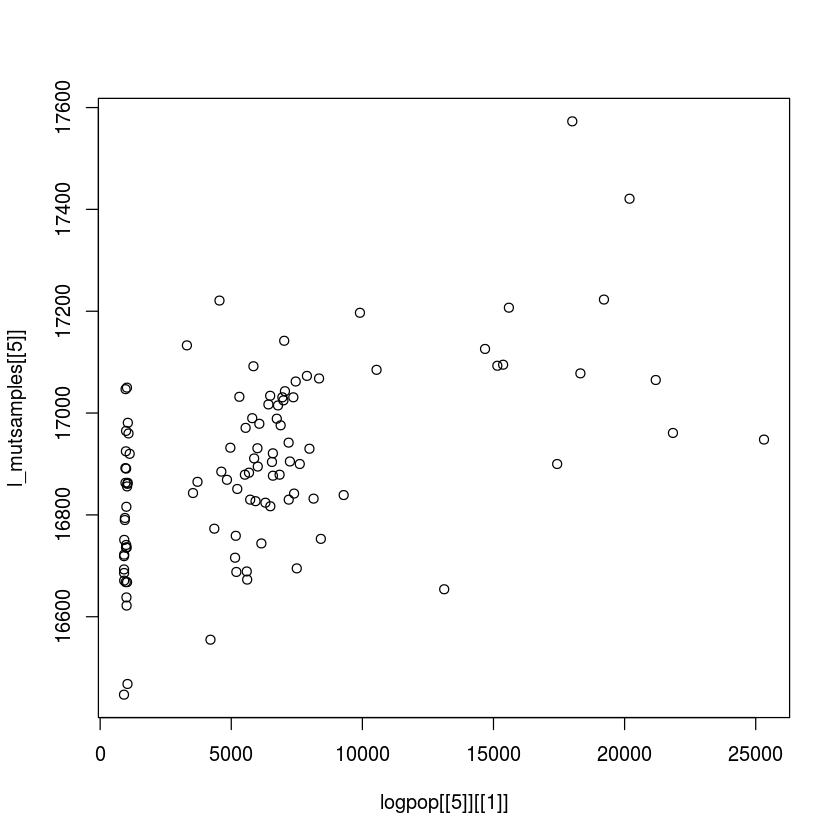

In [4]:
#mutational load and linkage correlate!!


length(l_mutsamples[[1]])
cor.test(logpop[[1]][[1]],l_mutsamples[[1]]) 
cor.test(logpop[[2]][[1]],l_mutsamples[[2]])
cor.test(logpop[[3]][[1]],l_mutsamples[[3]])
cor.test(logpop[[5]][[1]],l_mutsamples[[5]])
cor.test(logpop[[8]][[1]],l_mutsamples[[8]])
cor.test(logpop[[4]][[1]],l_mutsamples[[4]])
cor.test(logpop[[12]][[1]],l_mutsamples[[12]])
plot(logpop[[5]][[1]],l_mutsamples[[5]])

#Furthermore as well as more variance mutational load in pops with more linkage uneveness!!!
sd(l_mutsamples[[3]])/mean(l_mutsamples[[3]])
sd(l_mutsamples[[5]])/mean(l_mutsamples[[5]])
sd(l_mutsamples[[1]])/mean(l_mutsamples[[1]])
sd(l_mutsamples[[8]])/mean(l_mutsamples[[8]])
sd(l_mutsamples[[4]])/mean(l_mutsamples[[4]])
sd(l_mutsamples[[12]])/mean(l_mutsamples[[12]])

In [ ]:
#Developing null distribution

#-Thoughts on block separations:
#Other solution is using pairs of chromosome as independent blocks. This is conservative in finding differences between distributions. 
#However, it should still have the power.
#Also, should I consider the contribution like I do now, just sum. Well, it depends on the way of permuting it. If this way it is fine.
#see it like that however: when many pairs most likely I have enough power to consider even chromosomes as single blocks.
#when lower amount of pairs, separating becomes meaningful.

#elements in contingency tables (logpoptot)
mylog<-read.table(paste0("/mnt/scratch/fabrizio/LDLD/above95/coding1000g/logs/all.pop0.log")) #any pop is the same->to fix

myblocks<-create_blocks(mylog)
permbychr<-permute_chrAB_byblock(mylog,myblocks,100000)
myblocks2<-create_blocks(mylog,space_between_indep_blocks=1000000)
permbychrblocks2<-permute_chrAB_byblock(mylog,myblocks2,100000)
#save.image("permbychrblocks2.RData")
str(permbychrblocks)
sum(permbychrblocks2[,1]) #428177
sum(permbychr[,1]) #428177
var(permbychr[,1]) #137336.6
var(permbychrblocks2[,1]) #9129.772
#as expected less variance in fragmenting more


In [2]:
setwd("/mnt/scratch/fabrizio/LDLD")
load("nulldistr1iteration.RData")
load("permbychrblocks2.RData")
load("permbychr.RData")
load("logpop_fromfilelog.RData")
#always reload last version of functions in analysesLDLD_header.R after loading workspace images
source("~/Dropbox/LDLD/analysesLDLD_header.R") 

Loading required package: data.table
Loading required package: survival
Loading required package: lattice
Loading required package: Formula
Loading required package: ggplot2

Attaching package: ‘Hmisc’

The following objects are masked from ‘package:base’:

    format.pval, round.POSIXt, trunc.POSIXt, units

Loading required package: boot

Attaching package: ‘boot’

The following object is masked from ‘package:lattice’:

    melanoma

The following object is masked from ‘package:survival’:

    aml

Loading required package: MASS
Loading required package: segmented
mixtools package, version 1.0.3, Released 2015-04-18
This package is based upon work supported by the National Science Foundation under Grant No. SES-0518772.



In [3]:
head(logpop[[1]][[1]])

[1] 1114.5 1110.5 1026.5 1154.5 1109.0 1007.5

In [74]:
#Developing test for null distribution

#ok, so let's say that in case of this population we want to go forward in removing individuals

#system.time(permbychr<-permute_chrAB(mylog,10000)) #   user   system  elapsed 3885.680    0.410 3886.155
#save.image("permbychr.RData")
head(permbychr)
for (i in 1:10000)
{permbychr[,i]<-permbychr[,i][order(permbychr[,i])]}
for (i in 1:10000)
{permbychrblocks2[,i]<-permbychrblocks2[,i][order(permbychrblocks2[,i])]}

mydata<-permbychr[,1]
sum(permbychr[,10000]) #428177
#system.time(nulldistr1iteration<-generate_nulldistr_mixtures(permbychr,1000)) #time 448.160
#save(nulldistr1iteration,file="nulldistr1iteration.RData")
head(as.numeric(nulldistr1iteration[,1]))
head(as.numeric(nulldistr1iteration[,2]))
head(as.numeric(nulldistr1iteration[,3]))
head(as.numeric(nulldistr1iteration[,4]))

ERROR: Error in sprintf(wrap, header, body): 'fmt' length exceeds maximal format length 8192


3233,3042.5,3157,3407,3019.5,2841.5,2891.5,3047,2951,3166,⋯,3140.5,2993,3057,2729,3067.5,3060.5,2864,3045.5,3080,3213.5
3290.5,3117.5,3211,3421,3240,3164,2972.5,3168,3027,3305,⋯,3205,3092.5,3203.5,3350,3155,3173.5,3265,3077,3093.5,3327.5
3292.5,3147.5,3236,3423.5,3253.5,3222,3042.5,3274,3100,3305.5,⋯,3206.5,3124,3331,3364,3267.5,3177.5,3270.5,3318.5,3363.5,3374.5
3351.5,3164,3315.5,3438.5,3275.5,3262.5,3166,3282,3105,3308,⋯,3312,3229,3421,3385.5,3282,3178,3284,3358.5,3381,3379
3438.5,3351.5,3330,3448,3290.5,3294,3282.5,3282.5,3194.5,3330.5,⋯,3328.5,3258,3443.5,3456.5,3365,3268,3306,3364,3414.5,3425
3445,3365.5,3355,3461,3299,3298,3319.5,3406,3236,3350.5,⋯,3347,3286,3462.5,3469.5,3365,3276,3339,3371,3428.5,3436.5


[1] 428177

[1] 1 1 1 2 1 1

[1] 1 1 2 3 2 1

[1] 1.000000000 1.000000000 1.000000000 0.002568037 1.000000000 1.000000000

[1] 1.00000000 1.00000000 0.68149679 0.01315225 0.54861830 1.00000000

In [75]:
#compare value with distribution
setwd("~/Dropbox/LDLD")
source("analysesLDLD_header.R")
mypop<-partition_samples_nAB(logpop[[1]][[1]])[c(1,4,7,8)]
setwd("/mnt/scratch/fabrizio/LDLD")
sum(as.numeric(as.numeric(nulldistr1iteration[,1])>=mypop[1]))/1000 # 0.053 it seems that by taking only number of groups, both with LR and AIC I don't even get significant, although almost
sum(as.numeric(as.numeric(nulldistr1iteration[,2])>=mypop[2]))/1000 # 0.115
sum(as.numeric(as.numeric(nulldistr1iteration[,3])<=mypop[3]))/1000 # 0 instead by taking p-values or RL I get extremely significant.
sum(as.numeric(as.numeric(nulldistr1iteration[,4])<=mypop[4]))/1000 #0

number of iterations= 28 
number of iterations= 28 
number of iterations= 9 
number of iterations= 9 
number of iterations= 84 
[1] 6 6


[1] 0.06

[1] 0.12

[1] 0

[1] 0

In [47]:
system.time(testfull<-test_nulldistr_mixtures(12,1000,logpoptot,logpop,myblocks))

[[1]]
[1] 6

[[2]]
[1] 6

[[3]]
[1] 0

[[4]]
[1] 0.0000000000000000000000000000000000000000000000000000000000000000000000000003398291

In [26]:
head(logpop[[10]])

[[1]]
NULL

[[2]]
NULL

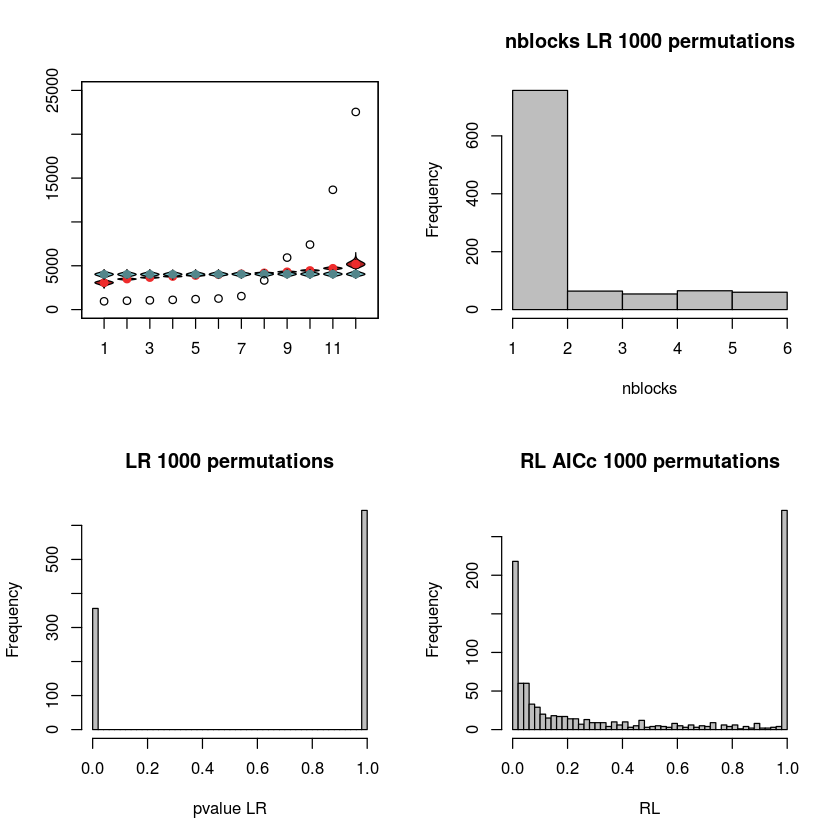

In [76]:
library(vioplot)
#pdf("empiricaldistrperm_pop1.pdf")
par(mfrow=c(2,2))
vioplot(permbychr[1,],permbychr[10,],permbychr[20,],permbychr[30,],permbychr[40,],permbychr[50,],permbychr[60,],permbychr[70,],permbychr[80,],permbychr[90,],permbychr[100,],permbychr[106,],ylim=c(0,25000),col="firebrick",colMed="firebrick2")
vioplot(permbychrblocks2[1,],permbychrblocks2[10,],permbychrblocks2[20,],permbychrblocks2[30,],permbychrblocks2[40,],permbychrblocks2[50,],permbychrblocks2[60,],permbychrblocks2[70,],permbychrblocks2[80,],permbychrblocks2[90,],permbychrblocks2[100,],permbychrblocks2[106,],add=TRUE,col="cadetblue3",colMed="cadetblue4")
mypop<-logpop[[1]][[1]][order(logpop[[1]][[1]])]
points(c(mypop[1],mypop[10],mypop[20],mypop[30],mypop[40],mypop[50],mypop[60],mypop[70],mypop[80],mypop[90],mypop[100],mypop[106]))
hist(as.numeric(nulldistr1iteration[,1]),breaks=1:6,main="nblocks LR 1000 permutations",xlab="nblocks",col="gray")
hist(as.numeric(nulldistr1iteration[,3]),breaks=50,main="LR 1000 permutations",xlab="pvalue LR",col="gray")
hist(as.numeric(nulldistr1iteration[,4]),breaks=50,main="RL AICc 1000 permutations",xlab="RL",col="gray")
#dev.off()

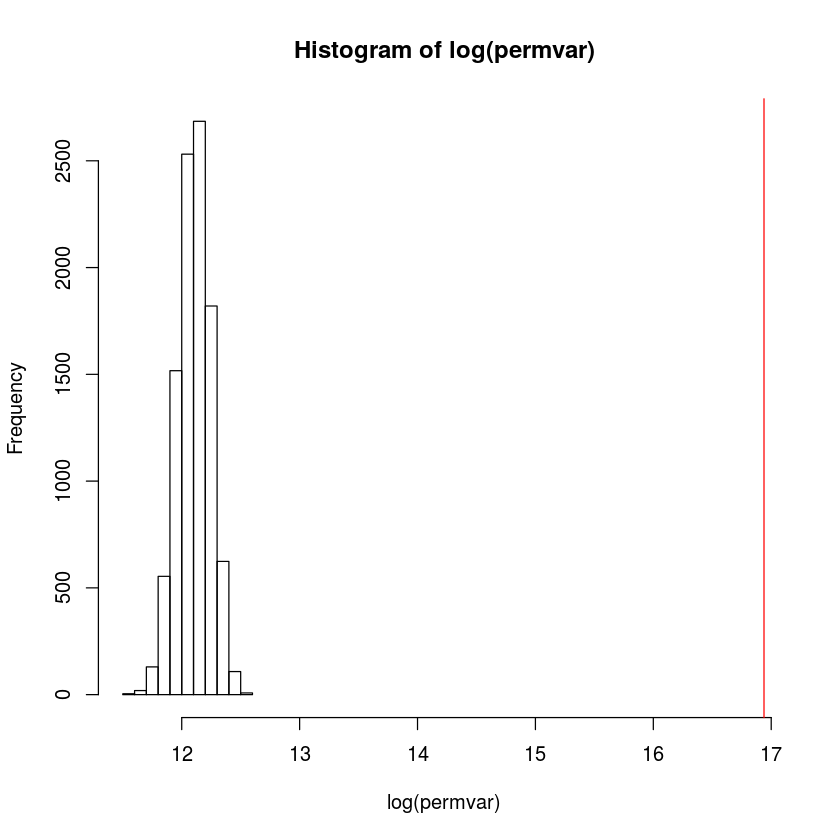

In [62]:
par(mfrow=c(1,1))
#pdf("empiricaldistrperm_pop1_var.pdf")
permvar<-sapply(1:10000,function(x) var(permbychr[,x]))
hist(log(permvar),xlim=c(log(min(permvar)),log(max(max(permvar),var(logpop[[1]][[1]]))+10)))
abline(v=log(var(logpop[[1]][[1]])),col="red")
#dev.off()

number of iterations= 28 
number of iterations= 28 
number of iterations= 9 
number of iterations= 9 
[1] 3 3
number of iterations= 39 
number of iterations= 34 
number of iterations= 17 
number of iterations= 29 
[1] 5 5
number of iterations= 40 
number of iterations= 37 
number of iterations= 263 
number of iterations= 200 
[1] 3 3
number of iterations= 28 
number of iterations= 859 
number of iterations= 329 
number of iterations= 313 
[1] 5 2
number of iterations= 9 
number of iterations= 43 
number of iterations= 586 
number of iterations= 85 
[1] 4 4
number of iterations= 20 
number of iterations= 43 
number of iterations= 230 
number of iterations= 421 
[1] 3 3
number of iterations= 17 
number of iterations= 268 
number of iterations= 80 
number of iterations= 127 
[1] 5 5


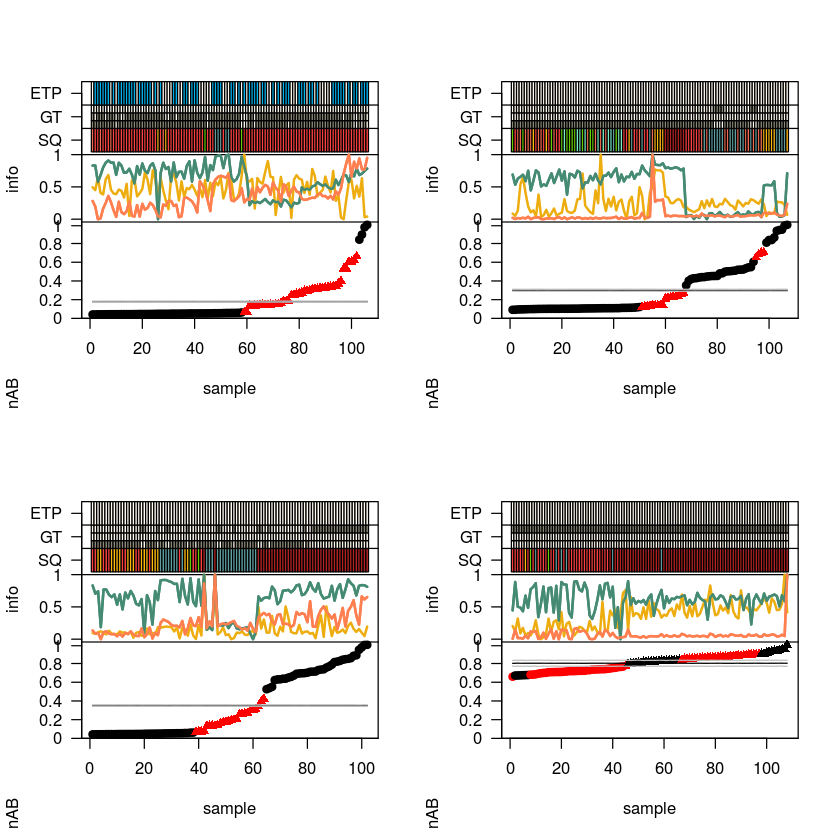

number of iterations= 17 
number of iterations= 18 
number of iterations= 22 
number of iterations= 225 
[1] 5 3
number of iterations= 11 
number of iterations= 30 
number of iterations= 21 
number of iterations= 6 
[1] 4 2
number of iterations= 56 
number of iterations= 116 
WARNING! NOT CONVERGENT! 
number of iterations= 1000 
number of iterations= 71 
[1] 3 3
number of iterations= 13 
number of iterations= 120 
One of the variances is going to zero;  trying new starting values.
number of iterations= 69 
One of the variances is going to zero;  trying new starting values.
number of iterations= 98 
[1] 4 4


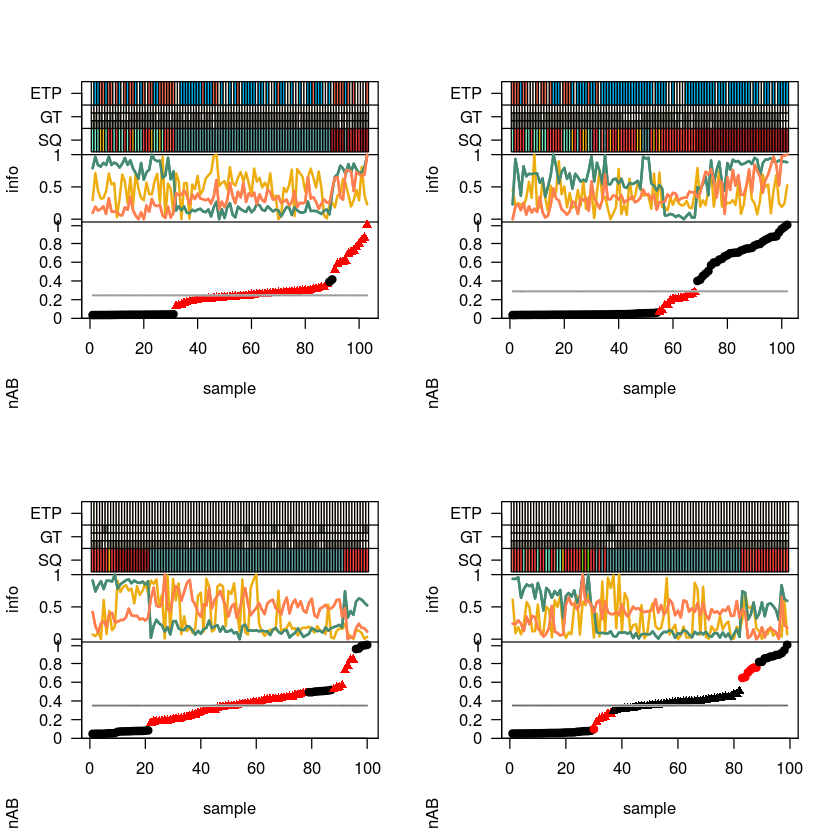

number of iterations= 60 
number of iterations= 161 
number of iterations= 255 
number of iterations= 476 
[1] 3 2


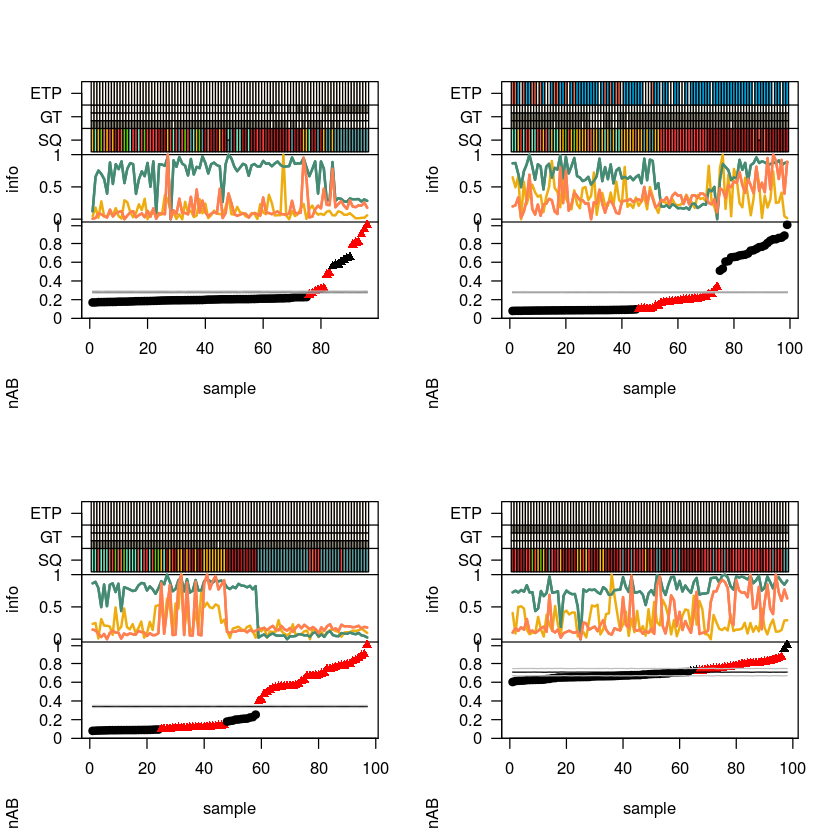

In [71]:
#---------------------------------------------------------------------------------------------------^
#------------------------------------explorative plots all pops together----------------------------v
#see TAG 'explorative plots all pops together' in analyses_coding1000g_SOM.R
#---------------------------------------------------------------------------------------------------^
#----TAG:info statistics in 1000genomes--v
#----------------------------------------^
#---histograms to illustrate separation method-----v 
#see TAG 'histograms to illustrate separation method in analysesLDLD_header' in analyses_coding1000g_SOM.R
#------------info panels--------------------v
load("LDLD170216.RData")
if (FALSE)
{
    par(mfrow=c(1,1))
    for (i in 10:10)
    {
        pdf(paste0("logplot",i,".pdf"))
        infoplot(i,mymaxk=5)
        dev.off()
    }
    pdf("logplot_panel.pdf")
    par(mfrow=c(2,2))
    for (i in 1:4)
        {
        infoplot(i)
        }
    dev.off()
}

par(mfrow=c(2,2))
    for (i in 1:12)
    {
        infoplot(i,mymaxk=5)
    }


In [78]:
#how to randomize properly to get confidence intervals of uniform expectation, taking into account local linkage?
#The most simple idea is uniform (or gaussian) expectation, then rank and plot.
#however, by doing this I neglect local linkage -> I need some sort of empirical distribution.
#The simple idea would be to randomize genotypes and then recalculate nAB, however this would change for sure the total number of nAB: it would still be good since I take proportions, but not really.
#Shuffle nAB blocks further than 50 Mb. I have two positions, how to do it? but A might be associated with two differen Bs.
#What do I want to randomize exactly? Hypothesis that 1 individuals cannot have all the possible linkage.
#--------------------------------------------------^

### PER SAMPLE PER SNP ANALYSES

In order to identify SNPs that contribute to linkage distribution the most

In [ ]:
#-----------analyses per SAMPLE per SNP------------v
#from log files. One possibility is to use function logpop2gen, that goes from log files to gen files, with 0 1 and 2 for homozygotes
#Otherwise, one can use a similar procedure as attached below. However very slow. 
#Therefore I recommend using all.freqlog files generated in C++ (see above in command line comments "create whole genome freqlog file".)
#
if (FALSE)  
{
  resres<-list()
  for (i in 10:10)
  {
    counter<-1
    for (ichrA in 1:21)
      {
      for (ichrB in (ichrA+1):22)
	{
	print(c(i,ichrA,ichrB))
	myn=as.numeric(system(paste0("head -12 above95/coding1000g/chr",ichrA,".tabchr",ichrB,".tab.log | awk '{if ($NF==",i,"){print NF}}'"),intern=TRUE))
	if (length(myn)<1) {myn=as.numeric(system(paste0("head -24 above95/coding1000g/chr",ichrA,".tabchr",ichrB,".tab.log | awk '{if (NR>12 && $NF==",i,"){print NF}}'"),intern=TRUE))}
	system(paste0("cat above95/coding1000g/chr",ichrA,".tabchr",ichrB,".tab.log | awk '{if ($NF==",i," && NF==",myn,"){print}}' > /mnt/scratch/fabrizio/LDLD/above95/coding1000g/all.pop.temp.log"))
	logsnp<-read.table("/mnt/scratch/fabrizio/LDLD/above95/coding1000g/all.pop.temp.log",header=FALSE)
	logsnp$chrA<-ichrA
	logsnp$chrB<-ichrB
	if (counter==1) {res<-logsnp} else {res<-rbind(res,logsnp)}
	if (ichrA==21 && ichrB==22) {resres[[i+1]]<-res}
	counter<-counter+1
	}
      }
  }
}
                   

In [ ]:
#load all.freqlog file
resres<-read.table("/mnt/scratch/fabrizio/LDLD/above95/coding1000g/all.freqlog")
resresnames<-paste0(resres[,1],".",resres[,2])
length(resres)
rress<-list()
for (i in 1:12)
{
rress[[i]]<-resres[,samples_imypopi(nspops,i)+2] #2*i comes from chr and pos fields
}
snpsnames<-sapply(1:dim(resres)[1],function(x) paste0(resres[x,1:2],collapse="."))
resres<-rress
rm(rress)
head(resres[[1]])

In [14]:
resres<-read.table("/mnt/scratch/fabrizio/LDLD/above95/coding1000g/all.freqlog")
resresnames<-paste0(resres[,1],".",resres[,2])

In [9]:
head(resres[[1]])

,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,ellip.h,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108
1,1,0,0,1,1,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,1,0,0,0


In [9]:
load("fullsign.RData")

In [12]:
fullsign_snps<-unique(paste0(c(fullsign[,1],fullsign[,2]),".",c(fullsign[,3],fullsign[,4])));
length(fullsign_snps)

[1] 47286

In [26]:
load("resres_complete.RData")

In [41]:
resres_fullsign<-list()
for (ipop in 1:12)
    {
    resres_fullsign[[ipop]]<-subset(resres[[ipop]],!is.na(match(resresnames,fullsign_snps))) #only significant    
    }


In [ ]:
#identify biased SNPs 
#(SNPs mostly present in nAB rich individuals)

tempres<-corr_nAvsnAB(resres,logpop,l_mutsamples) #this is done by looking at all SNPs.
tempres_sign<-corr_nAvsnAB(resres_fullsign,logpop,l_mutsamples,snpsnames=fullsign_snps) #this is done by looking only at SNPs that are linked.
#save.image("resres_complete.RData")

In [7]:
load("resres_complete.RData")

In [64]:
#more or less the same number of biased snps from first filtering in a way or the other. Difference might become
#more important when less total significant SNPs are considered
dim(tempres)
dim(tempres_sign)
dim(tempres[tempres[,3]<=0.05,])
dim(tempres[tempres[,2]<=0.05,])
removed_snps<-tempres[tempres[,3]<=0.05,]
dim(tempres_sign[tempres_sign[,3]<=0.05,])
dim(tempres_sign[tempres_sign[,2]<=0.05,])
removed_snpssign<-tempres_sign[tempres_sign[,3]<=0.05,]

[1] 75785     3

[1] 47286     3

[1] 612   3

[1] 598   3

[1] 610   3

[1] 605   3

In [ ]:
#create BED file with removed snps
write.table(stringsnp2bed(removed_snps),file="/mnt/scratch/fabrizio/LDLD/above95/coding1000g/removed1.bed",row.names = FALSE,quote=FALSE,sep='\t',col.names=FALSE)
for (mychr in 1:22)
{
system(paste0("bedtools intersect -v -b /mnt/scratch/fabrizio/LDLD/above95/coding1000g/removed1.bed -a /mnt/scratch/fabrizio/LDLD/above95/coding1000g/chr",mychr,".tab -header | gzip > /mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/chr",mychr,".coding.vcf.gz"))
}
if (FALSE)
{
rm /mnt/scratch/fabrizio/LDLD/above95/coding1000g/removed.bed
touch /mnt/scratch/fabrizio/LDLD/above95/coding1000g/removed.bed
for i in `seq 1 22`; do 
echo $i
zcat /mnt/sequencedb/ucsc/goldenPath/hg19/snp142.bed.gz | grep chr$i$'\t' > /mnt/scratch/fabrizio/LDLD/temp.bed
bedtools intersect -a <(cat /mnt/scratch/fabrizio/LDLD/above95/coding1000g/removed1.bed | sed 's/^/chr/g') -b /mnt/scratch/fabrizio/LDLD/temp.bed -sorted -wb| awk -v OFS='\t' '{print $4,$5,$6,$7}' >>  /mnt/scratch/fabrizio/LDLD/above95/coding1000g/removed.bed
done
#bedtools intersect -a <(cat /mnt/scratch/fabrizio/LDLD/above95/coding1000g/removed1.bed | sed 's/^/chr/g') -b /mnt/sequencedb/ucsc/goldenPath/hg19/snp142.bed.gz -sorted | awk -v OFS='\t' '{print $4,$5,$6,$7}' >  /mnt/scratch/fabrizio/LDLD/above95/coding1000g/removed.bed
}

In [ ]:
#Recreate list of snps without biased ones

load("above95/coding1000g/fullsign.RData") #from first filter in TAG 'LOAD_INITIAL_FILES'
dim(fullsign) #127771     24
source("~/Dropbox/LDLD/analysesLDLD_header.R")
ncomp<-read.table("above95/coding1000g/ncomparisons.txt",header=FALSE)
ncomp<-sum(ncomp$V1)
#res<-rebuild_dataLDLD(tempres[tempres[,2]<0.05,1],sign)
res<-rebuild_dataLDLD(tempres[tempres[,3]<0.05,1],fullsign) #links after removal of bad snps
dim(res) #57398    24
combined_fdr<-p.adjust(p=dchisq(res$X,df=2*res$popX), method = "fdr", n = ncomp) #NB: i did not correct ncomp, so they might be a bit more
length(combined_fdr) #57398
dim(res)
signleft<-res[combined_fdr<0.05,] #recomputing fdr after removal of bad snps
dim(signleft) #16578    24
myrem<-paste0(signleft[,1],".",signleft[,3],".",signleft[,2],".",signleft[,4])
length(myrem)
mysignm<-paste0(fullsign[,1],".",fullsign[,3],".",fullsign[,2],".",fullsign[,4])
mylogm<-paste0(mylog[,1],".",mylog[,3],".",mylog[,2],".",mylog[,4])
dim(rebuild_dataLDLD(myrem,fullsign,fromremovedsnps=FALSE)) #16578 as expected
dim(rebuild_dataLDLD(mysignm,fullsign,fromremovedsnps=FALSE)) #127771 as expected
dim(rebuild_dataLDLD(mylogm,mylog,fromremovedsnps=FALSE)) #127784 as expected
myres<-rebuild_dataLDLD(myrem,mylog,fromremovedsnps=FALSE)
dim(myres) #16451 some are missing #very few, annoying but they might be the few that differ in the various log files. fix that
#ok, now I should rerun analyses essentially excluding those bad snps (this last part just a quick check, actually not necessary).
#the crazy thing is that all this occurs because I have to recalculate how many comparisons for fdr, otherwise it wouldn't be needed. how can I avoid that step? I could just use version with no pvalues,
#but anyway I have to do bed intersect and stuffs. Maybe just code that does that? I don't think I can escape it.
#Actually if I have freqs per pop..still all the pairwise. But by pop. All snps that 
#if I have file with above thresholds for each pop then I could just do bedintersect on that and take..actually best rerunning everything again.


# LDLD filtered: Analyses after first iteration of LDLD cleaning (removal1)

### LOADING AND PREPARING FILES

In [ ]:
#-----------------------------------RUN AGAIN ICLD on cleaned data---------------------------------------------
#nohup ./ICLD11multi.sh /mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1 2 coding 1 12 1 23 nspops.txt &
#./postproc_split2.sh above95/coding1000g/removal1
#cat above95/coding1000g/removal1/anal/sorted.res | awk '{if (NF==23){print}}' > above95/coding1000g/removal1/anal/sorted2.res
#--------------------------------------------------------------------------------------------------------------

In [13]:
setwd("/mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/")
data<-read.table("/mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/anal/sorted2.res")
names(data)<-c("chrA","chrB","posA","posB","dbsnpA","dbsnpB","nA","nB","Nse","nAB","nAA","nBB","D","D1","rho2","prho2","pfisher","pKuli","T2","Xtot","X","pop","popX")
#system("cat /mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/*minilog | grep ncomparisons | awk '{print $14}' > /mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/ncomparisons.txt")
ncomp<-read.table("/mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/ncomparisons.txt",header=FALSE)
ncomp<-sum(ncomp$V1)
dataFIN<-subset(data,data$pop==7)
combined_fdr<-p.adjust(p=dchisq(dataFIN$X,df=2*dataFIN$popX), method = "fdr", n = ncomp) #not the best approach because like this I have all pairs. This is why probably at the beginning I was using a smaller cutoff.
length(combined_fdr)
dim(dataFIN)
dim(data)
fullsign<-cbind(dataFIN,combined_fdr)[combined_fdr<0.05,]
#save(fullsign,file="/mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/fullsign.RData")
#in early code called sign
rm(data,dataFIN)
dim(fullsign)
#str(fullsign)
#rm(chrA,chrB)
signAbed<-as.data.frame(cbind(as.character(paste0('chr',fullsign$chrA)),fullsign$posA-1,fullsign$posA),stringsAsFactors =FALSE)
signBbed<-as.data.frame(cbind(as.character(paste0('chr',fullsign$chrB)),fullsign$posB-1,fullsign$posB),stringsAsFactors =FALSE)
names(signAbed)<-c("chr","start","end")
names(signBbed)<-c("chr","start","end")
signAbed$start<-as.numeric(signAbed$start)
signAbed$end<-as.numeric(signAbed$end)
signBbed$start<-as.numeric(signBbed$start)
signBbed$end<-as.numeric(signBbed$end)
removal1_combined_fdr<-combined_fdr

[1] 57398

[1] 57398    23

[1] 689000     23

[1] 17301    24

In [90]:
#CREATE SUPPLEMENTARY FILES (e.g. BED)

#create logos
write.table(signAbed,file="/mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/anal/snpsA.bed",row.names = FALSE,quote=FALSE,sep='\t',col.names=FALSE);
write.table(signBbed,file="/mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/anal/snpsB.bed",row.names = FALSE,quote=FALSE,sep='\t',col.names=FALSE);
bedtools intersect -a <(cat /mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/anal/snpsA.bed | sed 's/^/chr/g') -b /mnt/sequencedb/ucsc/goldenPath/hg19/snp142.bed.gz -sorted -wb | awk -v OFS='\t' '{print $4,$5,$6,$7}' >  /mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/snpsA.bed
bedtools intersect -a <(cat /mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/anal/snpsB.bed | sed 's/^/chr/g') -b /mnt/sequencedb/ucsc/goldenPath/hg19/snp142.bed.gz -sorted -wb | awk -v OFS='\t' '{print $4,$5,$6,$7}' >  /mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/snpsB.bed
#for trios
dim(fullsign[fullsign$pfisher<0.05,]) #1290
fortrios<-fullsign[fullsign$pfisher<0.05,]
#subset(fortrios,fortrios[,1]==10)[,1:4]
triosAbed<-as.data.frame(cbind(as.character(paste0('chr',fortrios$chrA)),fortrios$posA-1,fortrios$posA),stringsAsFactors =FALSE)
triosBbed<-as.data.frame(cbind(as.character(paste0('chr',fortrios$chrB)),fortrios$posB-1,fortrios$posB),stringsAsFactors =FALSE)
names(triosAbed)<-c("chr","start","end")
names(triosBbed)<-c("chr","start","end")
triosAbed$start<-as.numeric(triosAbed$start)
triosAbed$end<-as.numeric(triosAbed$end)
triosBbed$start<-as.numeric(triosBbed$start)
triosBbed$end<-as.numeric(triosBbed$end)
write.table(triosAbed,file="/mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/anal/FINA.bed",row.names = FALSE,quote=FALSE,sep='\t',col.names=FALSE);
write.table(triosBbed,file="/mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/anal/FINB.bed",row.names = FALSE,quote=FALSE,sep='\t',col.names=FALSE);
combined_fdr<-p.adjust(p=fullsign$pfisher, method = "fdr", n = ncomp)
length(combined_fdr[combined_fdr<0.05]) #0
combined_fdr<-p.adjust(p=fullsign$pKuli, method = "fdr", n = ncomp)
length(combined_fdr[combined_fdr<0.05]) #0
combined_fdr<-p.adjust(p=fullsign$T2, method = "fdr", n = ncomp)
length(combined_fdr[combined_fdr<0.05]) #96
fullsign[combined_fdr<0.05,]
triosT2Abed<-fullsign[combined_fdr<0.05,]
triosT2Bbed<-fullsign[combined_fdr<0.05,]
triosT2Abed<-as.data.frame(cbind(as.character(paste0('chr',triosT2Abed$chrA)),triosT2Abed$posA-1,triosT2Abed$posA),stringsAsFactors =FALSE)
triosT2Bbed<-as.data.frame(cbind(as.character(paste0('chr',triosT2Bbed$chrB)),triosT2Bbed$posB-1,triosT2Bbed$posB),stringsAsFactors =FALSE)
names(triosT2Abed)<-c("chr","start","end")
names(triosT2Bbed)<-c("chr","start","end")
triosT2Abed$start<-as.numeric(triosT2Abed$start)
triosT2Abed$end<-as.numeric(triosT2Abed$end)
triosT2Bbed$start<-as.numeric(triosT2Bbed$start)
triosT2Bbed$end<-as.numeric(triosT2Bbed$end)
write.table(triosT2Abed,file="/mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/anal/FINT2A.bed",row.names = FALSE,quote=FALSE,sep='\t',col.names=FALSE);
write.table(triosT2Bbed,file="/mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/anal/FINT2B.bed",row.names = FALSE,quote=FALSE,sep='\t',col.names=FALSE);
system("cat /mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/anal/FINA.bed /mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/anal/FINB.bed | sort -Vu -k1,1 -k2,2 > /mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/anal/FIN.bed")
system("cat /mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/anal/FINT2A.bed /mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/anal/FINT2B.bed | sort -Vu -k1,1 -k2,2 > /mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/anal/FINT2.bed")

if (FALSE)
{
#rm /mnt/scratch/fabrizio/LDLD/above95/coding1000g/FIN.bed
touch /mnt/scratch/fabrizio/LDLD/above95/coding1000g/FIN.bed
cat /mnt/scratch/fabrizio/LDLD/above95/coding1000g/FIN.bed
for i in `seq 1 22`; do 
echo $i
zcat /mnt/sequencedb/ucsc/goldenPath/hg19/snp142.bed.gz | grep chr$i$'\t' > /mnt/scratch/fabrizio/LDLD/temp2.bed
bedtools intersect -a /mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/anal/FIN.bed -b 
    /mnt/sequencedb/1000Genomes/ftp/phase3/20140910/functional_annotation/filtered/temp/missense.chr$i.temp.e -sorted -wb  >>  
    /mnt/scratch/fabrizio/LDLD/above95/coding1000g/FIN.bed
done
#cat above95/coding1000g/removal1/anal/FINA.bed above95/coding1000g/removal1/anal/FINB.bed | sort -Vu -k1,1 -k2,2 | wc -l
}

#--------------------- creates polymorphism per individual (mutlog) file (newer)   ------------------v
#for i in `seq 1 22`; do 
#./filterbyfreq.out above95/coding1000g/removal1/chr$i.tab above95/coding1000g/removal1/chr$i.freqlog above95/coding1000g/removal1/chr$i.tab.mutlog 0.05 1300 & 
#done
#system("cat /mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/chr*.tab.mutlog > /mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/tot.mutlog")
#-------------------- create whole genome freqlog file (genotype per sample) ---------------------------------------------------
#rm /mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/all.freqlog
#for i in `seq 1 22`; do 
#cat above95/coding1000g/removal1/chr$i.freqlog | awk -v FS='\t' -v OFS='\t' -v CHR=$i '{if (NR>1){print CHR,$0}}' >> /mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/all.freqlog
#done

ERROR: Error in parse(text = x, srcfile = src): <text>:6:10: unexpected symbol
5: write.table(signBbed,file="/mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/anal/snpsB.bed",row.names = FALSE,quote=FALSE,sep='\t',col.names=FALSE);
6: bedtools intersect
            ^


In [16]:
#create gen file

resres<-read.table("/mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/all.freqlog")
rress<-list()
for (i in 1:12)
{
rress[[i]]<-resres[,samples_imypopi(nspops,i)+2] #2*i comes from chr and pos fields
}
resresnames<-sapply(1:dim(resres)[1],function(x) paste0(resres[x,1:2],collapse="."))
#resres<-rress #let's call resres as gen (file with the single snp genotypes
rm(rress)
removal1_resresgen<-rress
#save(removal1_resresgen,file="/mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/removal1_resresgen.RData")
#save(removal1_resresnames,file="/mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/removal1_resresnames.RData")

ERROR: Error in `[.data.frame`(resres, , samples_imypopi(nspops, i) + 2): could not find function "samples_imypopi"


ERROR: Error in eval(expr, envir, enclos): object 'rress' not found


In [ ]:
resresnames

In [91]:
dim(removal1_resresgen[[1]])
length(resresnames)

[1] 75172   106

[1] 75172

In [ ]:
#create logpop file

for (i in 0:11)
{
  system(paste0("cat /mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/chr*.log | awk '{if ($NF==",i,"){print}}' > /mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/all.pop",i,".log"))
}

myfolder<-"/mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1"
logpop<-pairsANDlogfiles2logpop(myfolder,mysign=fullsign,12,22)
#save(logpop,file="removal1_logpop.RData")

In [ ]:
#create l_mutsamples file

for (i in 1:22)
{
if (i==1){mutperssample<-as.numeric(read.table(paste0("/mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/chr",i,".tab.mutlog")))}
else {res2<-as.numeric(read.table(paste0("/mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/chr",i,".tab.mutlog")));mutperssample<-rbind(mutperssample,res2)}
}
l_mutsamples<-lapply(1:12,function(x) c())
for (i in 1:12)
{
  l_mutsamples[[i]]<-apply(mutperssample[,samples_imypopi(nspops,i)],2,sum)
}
#save(l_mutsamples,file="removal1_l_mutsamples.RData")

In [ ]:
#create logpoptot file

logpoptot<-pairsANDlogfiles2logpop("/mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1",ntot_pops=12,summarize=FALSE)
myblocks_removal1<-create_blocks(logpoptot[[1]]) #still undivided
#save(logpoptot,file="removal1_logpoptot.RData")

#create test file of observed values vs null distribution

#notice that correlation is genome-wide. Hence there might be some snps that are not linked significantly but still overrepresented
#in samples with high nAB
system.time(test_removal1<-test_nulldistr_mixtures(12,1000,logpoptot,logpop,myblocks_removal1))
#save(test_removal1,file="removal1_test.RData")
#save.image("removal1_0.RData")

In [14]:
setwd("/mnt/scratch/fabrizio/LDLD")
load("removal1_resresgen.RData") 
head(removal1_resresgen[[1]])
load("removal1_l_mutsamples.RData")
head(l_mutsamples[[1]])
setwd("~/Dropbox/LDLD")
load("removal1_logpop.RData")
head(logpop[[1]])
load("removal1_logpoptot.RData")
head(logpoptot[[1]])

,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,ellip.h,V99,V100,V101,V102,V103,V104,V105,V106,V107,V108
1,1,0,0,1,1,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,1,0,0,0
3,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,1,0,0,0
5,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,⋯,0,0,0,0,0,0,1,0,0,0


[1] 17336 17582 17170 17339 17494 17492

[[1]]
  [1] 295.0 269.5 254.0 271.5 277.0 263.0 277.0 267.5 268.5 286.0 267.0 271.0
 [13] 235.0 258.0 278.0 307.0 234.5 237.5 256.5 277.5 285.0 260.0 247.5 261.5
 [25] 292.0 260.5 258.5 310.0 256.0 312.5 290.0 261.0 260.0 296.0 238.5 265.0
 [37] 256.0 250.0 297.0 260.0 257.5 327.5 292.5 259.5 298.0 266.0 294.0 262.0
 [49] 311.0 263.5 294.5 291.0 296.0 329.0 272.0 264.0 245.5 241.0 273.0 317.0
 [61] 283.0 251.5 275.5 268.0 328.0 252.5 274.5 288.5 259.0 265.5 324.5 257.5
 [73] 274.0 268.5 306.5 315.0 286.0 286.0 285.5 250.5 280.5 298.5 283.0 275.0
 [85] 282.5 308.0 260.5 275.5 303.0 299.0 250.5 271.0 285.5 274.0 269.0 259.0
 [97] 267.0 299.5 243.5 262.5 264.5 264.5 246.0 294.5 280.5 291.0

[[2]]
  [1] 1679.0 1806.0 1768.0 1825.5 1857.0 1725.0 1822.5 1770.0 1840.5 1881.5
 [11] 1768.5 1824.5 1682.0 1769.0 1912.0 1831.0 1855.5 1716.0 1758.0 1847.5
 [21] 1882.0 1774.5 1827.0 1799.0 1838.0 1744.5 1785.0 1851.5 1758.5 1840.5
 [31] 1821.0 1797.5 1801.0 1854.5 1764.0 1847.5 1792.0 1612.5 1837.5 1760.5
 [41] 1797.0 1791.0 1754.0 1826.0 1870.0 1818.5 1605.0 1831.0 1839.0 1798.5
 [51] 1820.0 1884.0 1873.0 1892.5 1838.5 1814.5 1826.0 1751.0 1866.0 1853.5
 [61] 1890.0 1819.0 1774.5 1779.5 1852.0 1772.0 1845.5 1831.5 1842.0 1795.0
 [71] 1895.5 1738.5 1851.0 1813.5 1895.0 1867.0 1824.0 1826.0 1790.0 1753.5
 [81] 1886.0 1830.5 1851.0 1857.5 1884.5 1888.5 1834.5 1822.0 1862.0 1898.0
 [91] 1784.0 1778.0 1816.5 1876.5 1834.0 1794.5 1781.0 1828.0 1761.5 1855.0
[101] 1776.0 1827.0 1694.0 1830.0 1788.5 1839.0

,chrA,chrB,V1,V2,V3,V4,V5,V6,V7,V8,ellip.h,V100,V101,V102,V103,V104,V105,V106,V107,V108,V109
4,1,2,907799,96944553,0,0,0,2,2,0,⋯,0,0,2,2,2,2,0,0,2,0
5,1,2,908323,96944553,0,0,0,2,2,0,⋯,0,0,2,2,2,2,0,0,2,0
11,1,2,1226889,26700373,0,4,0,2,0,0,⋯,0,0,0,0,0,0,0,0,0,0
13,1,2,1361736,11758491,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
28,1,2,1597356,219559018,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0
30,1,2,1849923,64189566,0,0,0,0,0,0,⋯,0,0,0,0,0,0,0,0,0,0


### PER SAMPLE ANALYSES

number of iterations= 335 
number of iterations= 187 
number of iterations= 302 
number of iterations= 485 
number of iterations= 509 
[1] 5 1
number of iterations= 192 
number of iterations= 278 
WARNING! NOT CONVERGENT! 
number of iterations= 1000 
WARNING! NOT CONVERGENT! 
number of iterations= 1000 
WARNING! NOT CONVERGENT! 
number of iterations= 1000 
[1] 6 6
number of iterations= 13 
number of iterations= 367 
WARNING! NOT CONVERGENT! 
number of iterations= 1000 
WARNING! NOT CONVERGENT! 
number of iterations= 1000 
One of the variances is going to zero;  trying new starting values.
WARNING! NOT CONVERGENT! 
number of iterations= 1000 
[1] 2 2
number of iterations= 99 
number of iterations= 138 
WARNING! NOT CONVERGENT! 
number of iterations= 1000 
WARNING! NOT CONVERGENT! 
number of iterations= 1000 
WARNING! NOT CONVERGENT! 
number of iterations= 1000 
[1] 3 3
number of iterations= 106 
number of iterations= 151 
WARNING! NOT CONVERGENT! 
number of iterations= 1000 
number of i

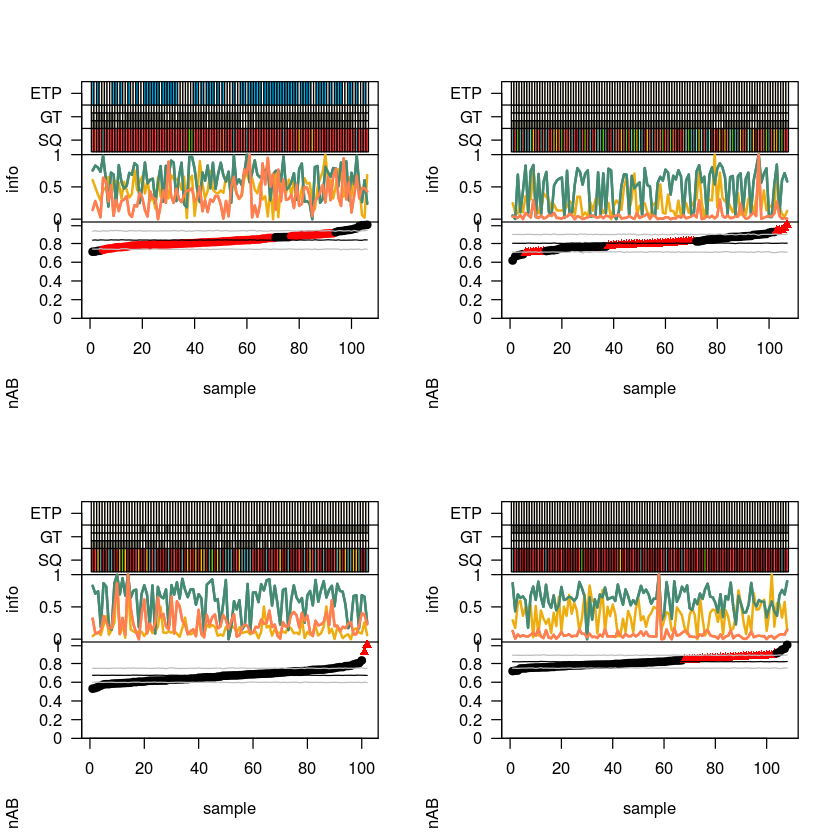

number of iterations= 120 
number of iterations= 785 
number of iterations= 589 
WARNING! NOT CONVERGENT! 
number of iterations= 1000 
One of the variances is going to zero;  trying new starting values.
One of the variances is going to zero;  trying new starting values.
WARNING! NOT CONVERGENT! 
number of iterations= 1000 
[1] 2 1
number of iterations= 2 
WARNING! NOT CONVERGENT! 
number of iterations= 1000 
WARNING! NOT CONVERGENT! 
number of iterations= 1000 
number of iterations= 445 
One of the variances is going to zero;  trying new starting values.
number of iterations= 282 
[1] 6 6
number of iterations= 242 
WARNING! NOT CONVERGENT! 
number of iterations= 1000 
number of iterations= 323 
number of iterations= 262 
WARNING! NOT CONVERGENT! 
number of iterations= 1000 
[1] 2 1
WARNING! NOT CONVERGENT! 
number of iterations= 1000 
number of iterations= 632 
WARNING! NOT CONVERGENT! 
number of iterations= 1000 
One of the variances is going to zero;  trying new starting values.
One 

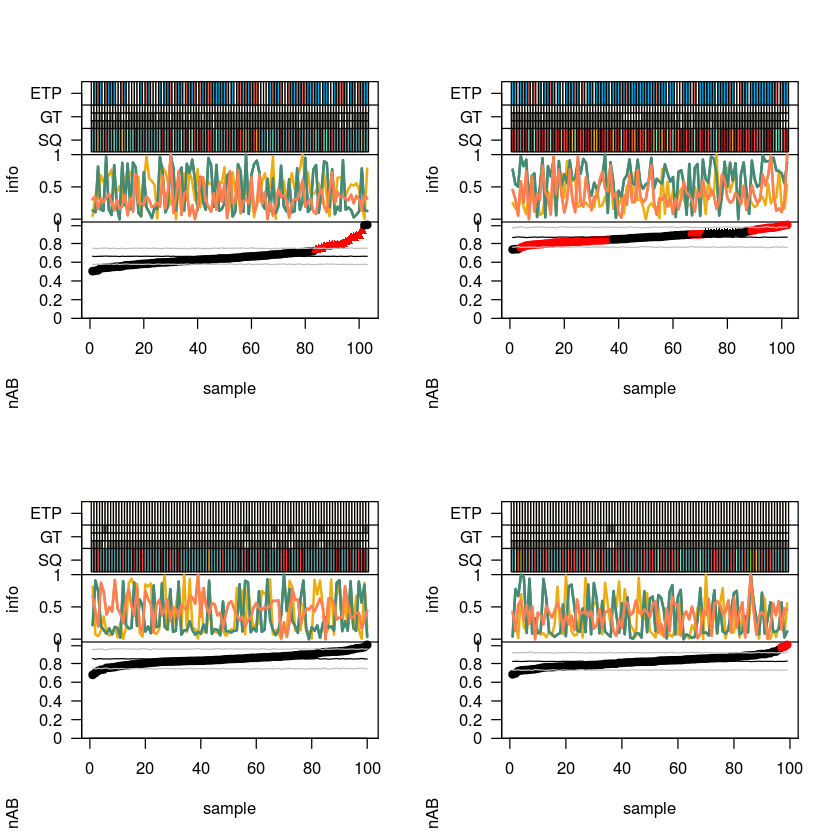

WARNING! NOT CONVERGENT! 
number of iterations= 1000 
WARNING! NOT CONVERGENT! 
number of iterations= 1000 
number of iterations= 905 
number of iterations= 260 
WARNING! NOT CONVERGENT! 
number of iterations= 1000 
[1] 1 1


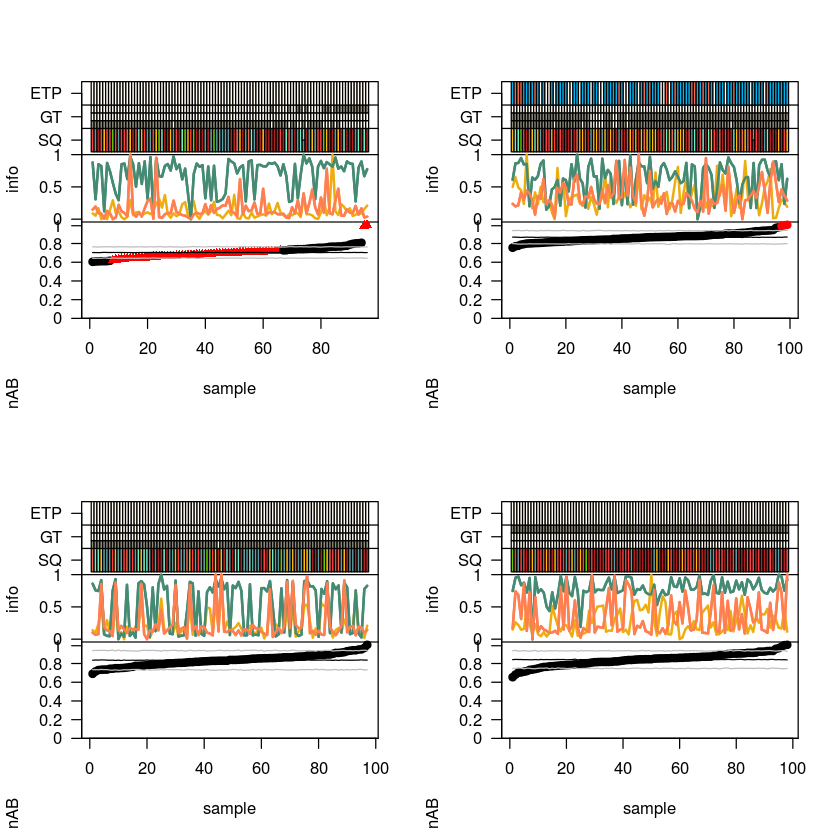

In [107]:
par(mfrow=c(2,2))
for (i in 1:12)
{
#pdf(paste0("logplot_removal1_",i,".pdf"))
infoplot(i)
#dev.off()
}

In [11]:
load("removal1_test.RData")

In [12]:
sapply(1:12,function(x) test_removal1[[x]]$pval_sd)
sapply(1:12,function(x) test_removal1[[x]]$pval_nLR)
sapply(1:12,function(x) test_removal1[[x]]$pval_nAIC)
sapply(1:12,function(x) test_removal1[[x]]$pval_pLR)
sapply(1:12,function(x) test_removal1[[x]]$pval_pAIC)

[1] 0.065 0.003 0.000 0.001 0.000 0.528 1.000 0.048 0.000 0.019 0.065 0.004

[1] 1.000 0.041 0.251 0.162 0.149 0.161 1.000 1.000 0.031 1.000 1.000 1.000

[1] 0.198 0.093 0.698 0.477 0.445 0.067 1.000 0.649 0.072 0.657 1.000 1.000

[1] 0.746 0.747 0.945 0.836 0.998 0.993 0.786 0.774 1.000 0.744 0.774 0.754

[1] 0.827 0.383 0.942 0.811 0.998 0.996 0.389 0.426 1.000 0.589 0.379 0.328

### PER SAMPLE PER SNP ANALYSES

In [18]:
fullsign_snps<-unique(paste0(c(fullsign[,1],fullsign[,2]),".",c(fullsign[,3],fullsign[,4])));
length(fullsign_snps)
resres_fullsign<-list()
for (ipop in 1:12)
    {
    resres_fullsign[[ipop]]<-subset(removal1_resresgen[[ipop]],!is.na(match(resresnames,fullsign_snps))) #only significant    
    }

[1] 21515

In [93]:
length(fullsign_snps)

[1] 21515

In [ ]:
#remova snps that contribute the most to nAB

removal1_removesnps<-corr_nAvsnAB(removal1_resresgen,logpop,l_mutsamples)
removal1_removesnps_sign<-corr_nAvsnAB(resres_fullsign,logpop,l_mutsamples,snpsnames=fullsign_snps)
#save(removal1_removesnps,file="removal1_removesnps.RData")
#save(removal1_removesnps_sign,file="removal1_removesnps_sign.RData")

In [4]:
load("/mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1_removesnps.RData")
load("/mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/removal1_removesnps_sign.RData")

In [5]:
head(removal1_removesnps)

snpsnames,,
1.881918,0.616835752094828,0.705561762335829
1.887801,0.988158497993252,0.979745795647466
1.888639,0.979359011291674,0.969807593266689
1.888659,0.979359011291674,0.969807593266689
1.889238,0.961825299658689,0.953341411195013
1.897325,0.780360172746471,0.831840965911329


In [105]:
#almost empty! possibly because I try to clean whole data-sets, not restricting to the linked ones, so that I have a very big n for the fdr correction. #let's try restricting it.
removal1_removesnps[removal1_removesnps[,2]<=0.05,]
removal1_removesnps[removal1_removesnps[,3]<=0.05,]

snpsnames                                           
       "1.120437718" "0.0333837343586685" "0.0348599573226155"

snpsnames,,
1.120437718,0.0333837343586685,0.0348599573226155
3.37458851,0.488133442796183,0.00790962622901595
19.9225685,0.849499038761037,0.00451235293451637
19.9225940,0.849499038761037,0.00451235293451637
21.43319214,0.503274969821898,0.0348599573226155


In [97]:
#still almost empty!and no overlap!
removal1_removesnps_sign[removal1_removesnps_sign[,2]<=0.05,]
removal1_removesnps_sign[removal1_removesnps_sign[,3]<=0.05,]

snpsnames,,


snpsnames,,
3.37845391,0.462441143470269,0.00391905396038149
7.150066008,0.813334283789729,0.0439574378077509
17.76794586,0.785941561972173,0.035438943580554
17.39925733,0.842277264373234,0.0439574378077509
11.8933004,0.839014477290768,0.00130427376040347
11.55035844,0.839014477290768,0.00130427376040347


In [22]:
#fdr for real data

dim(fullsign)
res<-rebuild_dataLDLD(removal1_removesnps[removal1_removesnps[,3]<0.05,1],fullsign)
res_sign<-rebuild_dataLDLD(removal1_removesnps_sign[removal1_removesnps_sign[,3]<0.05,1],fullsign)
dim(res)
dim(res_sign)
combined_fdr<-p.adjust(p=dchisq(res$X,df=2*res$popX), method = "fdr", n = ncomp) #NB: i did not correct ncomp, so they might be a bit more
combined_fdr_sign<-p.adjust(p=dchisq(res_sign$X,df=2*res_sign$popX), method = "fdr", n = ncomp)
signleft<-res[combined_fdr<0.05,]
signleft_sign<-res_sign[combined_fdr_sign<0.05,]
dim(signleft) #16578    24
dim(signleft_sign) #16578    24

[1] 17301    24

[1] 17296    24

[1] 17294    24

[1] 16573    24

[1] 16571    24

In [ ]:
#fdr for null distribution

nperm<-3
reschr_count<-rep(0,nperm)
combined_fdr_l<-list()
for (myperm in 1:nperm)
    {
    data<-read.table(paste0("/mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/reschr",myperm,"/anal/sorted.res"))
    names(data)<-c("chrA","chrB","posA","posB","dbsnpA","dbsnpB","nA","nB","Nse","nAB","nAA","nBB","D","D1","rho2","prho2","pfisher","pKuli","T2","Xtot","X","pop","popX")
    system(paste0("cat /mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/reschr",myperm,"/*minilog | grep ncomparisons | awk '{print $14}' > /mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/reschr",myperm,"/ncomparisons.txt"))
    ncomp<-read.table(paste0("/mnt/scratch/fabrizio/LDLD/above95/coding1000g/removal1/reschr",myperm,"/ncomparisons.txt"),header=FALSE)
    ncomp<-sum(ncomp$V1)
    dataFIN<-subset(data,data$pop==7)
    combined_fdr<-p.adjust(p=dchisq(dataFIN$X,df=2*dataFIN$popX), method = "fdr", n = ncomp) #not the best approach because like this I have all pairs. This is why probably at the beginning I was using a smaller cutoff.
    fullsign_reschr<-cbind(dataFIN,combined_fdr)[combined_fdr<0.05,]
    combined_fdr_l[[myperm]]<-combined_fdr
    reschr_count[myperm]<-dim(fullsign_reschr)[1]
    }
#save("combined_fdr_l",file="~/Dropbox/LDLD/removal1_combined_fdr_l.RData")

Warning message:
In system(paste0("cat /mnt/scratch/fabrizio/LDLD/above95/coding1000g/reschr", : system call failed: Cannot allocate memory

In [34]:
load("~/Dropbox/LDLD/removal1_combined_fdr_l.RData")
length(removal1_combined_fdr)
length(combined_fdr)
dim(fullsign)
dim(fullsign_reschr)
reschr_count

[1] 57398

[1] 57471

[1] 17301    24

[1] 16020    24

[1]     0 16020     0     0

In [35]:
load("~/Dropbox/LDLD/removal1_combined_fdr_l.RData")
str(combined_fdr_l)

List of 3
 $ : num [1:55702] 0.0608 0.0129 0.0137 0.0129 0.0893 ...
 $ : num [1:55598] 0.0583 0.0759 0.0666 0.0757 0.0722 ...
 $ : num [1:56160] 0.0858 0.0567 0.024 0.0681 0.0557 ...


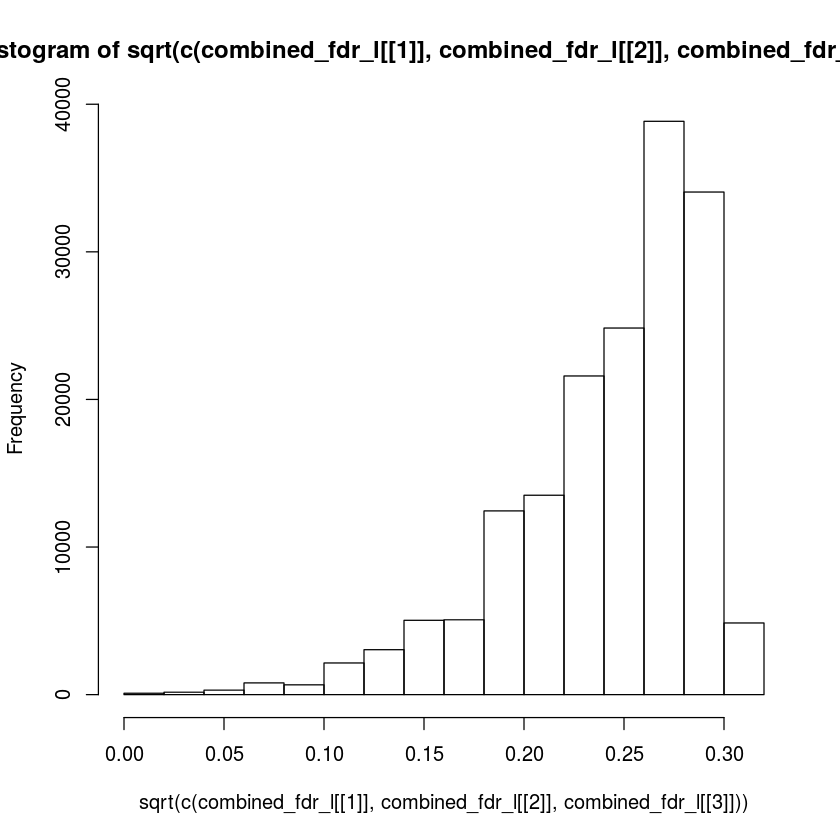

In [38]:
histnull<-hist(sqrt(c(combined_fdr_l[[1]],combined_fdr_l[[2]],combined_fdr_l[[3]])),breaks=15);
histnull$counts<-histnull$counts/2

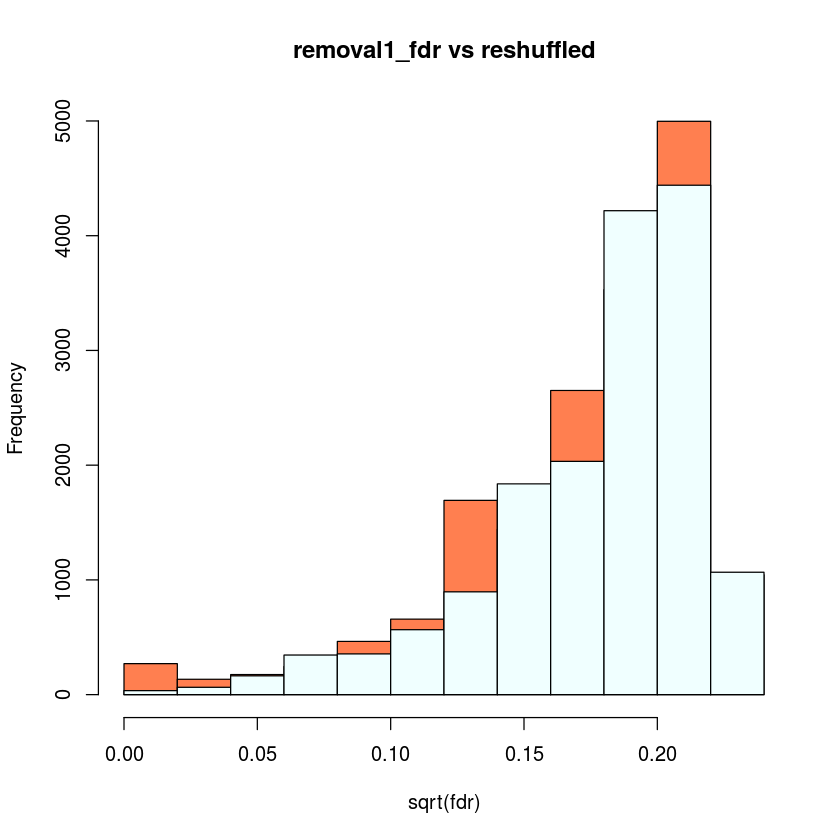

In [37]:
hist(sqrt(removal1_combined_fdr[removal1_combined_fdr<0.05]),breaks=15,col="coral",main="removal1_fdr vs reshuffled",xlab="sqrt(fdr)")
hist(sqrt(combined_fdr[combined_fdr<0.05]),breaks=15,col="azure",add=TRUE)


In [28]:
length(removal1_combined_fdr[removal1_combined_fdr<0.05])

[1] 17301

In [43]:
removal1_combined_fdr[1]

[1] 0.07082558

In [ ]:
res<-empiricall_fdr(removal1_combined_fdr,c(combined_fdr_l[[1]],combined_fdr_l[[2]],combined_fdr_l[[3]]),3)

[1] 149

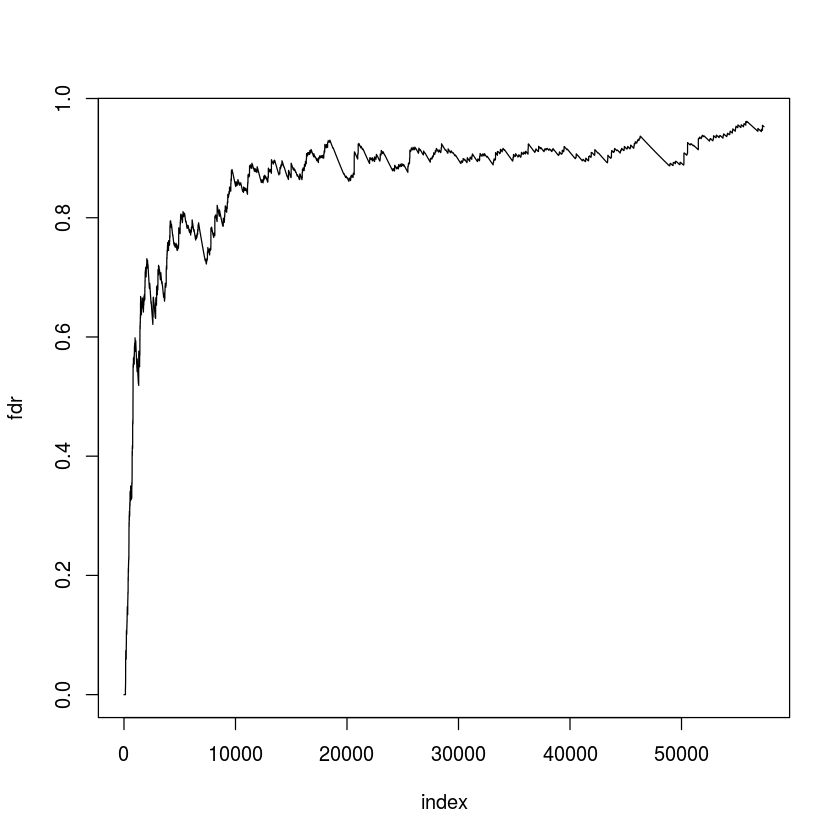

In [60]:
length(res[res<0.05])
plot(res,type="l",xlab="index",ylab="fdr")